Optimization terminated successfully.
         Current function value: 1.414214
         Iterations: 43
         Function evaluations: 159
Optimized t values: [0.21 0.4  0.6  0.8 ]


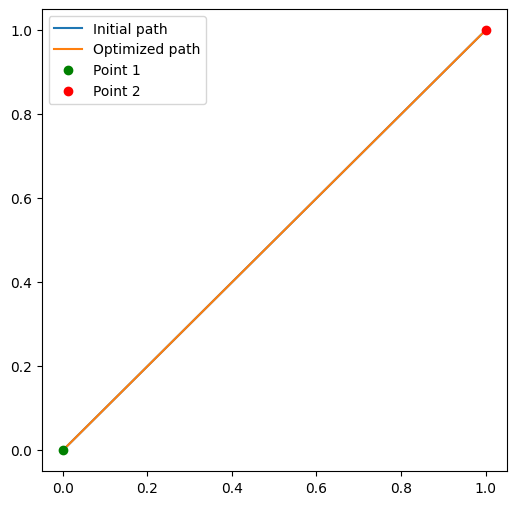

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import minimize

# 定义两个点
point1 = np.array([0, 0])
point2 = np.array([1, 1])

# 定义路径的参数表示，这里我们使用一个参数 t，代表从 point1 到 point2 的比例
def path(t):
    # 当 t 是一个数组时，我们需要对数组中的每个元素单独处理
    if isinstance(t, np.ndarray):
        return np.array([point1 * (1 - ti) + point2 * ti for ti in t])
    else:
        return point1 * (1 - t) + point2 * t

# 定义路径长度的函数，我们需要对这个函数进行优化
def path_length(t):
    # 将 t 分解成许多小段
    t_values = np.linspace(0, 1, len(t)+2)
    t_values[1:-1] = t

    # 计算路径上各点之间的距离
    distances = [np.linalg.norm(path(t_values[i+1]) - path(t_values[i])) for i in range(len(t_values)-1)]

    # 返回总距离
    return np.sum(distances)

# 初始的 t 值，我们选择五个点，即将路径分成四段
t_initial = np.array([0.2, 0.4, 0.6, 0.8])

# 使用 scipy 的 minimize 函数来求解优化问题
result = minimize(path_length, t_initial, method='nelder-mead', options={'xatol': 1e-8, 'disp': True})

# 打印结果
print("Optimized t values:", result.x)

# 绘制原始路径和优化后的路径
t_values = np.linspace(0, 1, 100)
plt.figure(figsize=(6, 6))
plt.plot(*path(t_values).T, label="Initial path")
plt.plot(*path(np.concatenate([[0], result.x, [1]])).T, label="Optimized path")
plt.plot(*point1, 'go', label="Point 1")
plt.plot(*point2, 'ro', label="Point 2")
plt.legend()
plt.show()


In [229]:
import numpy as np
from scipy.interpolate import interp1d
from sklearn.decomposition import PCA
from scipy.interpolate import CubicSpline
import matplotlib.pyplot as plt
from scipy.stats import zscore

def arc_length_parametrize(curve):
    # 计算曲线上每两个连续点之间的距离
    diffs = np.diff(curve, axis=0)
    segment_lengths = np.sqrt((diffs**2).sum(axis=1))

    # 累加这些距离得到每个点的弧长
    arc_lengths = np.concatenate([[0], np.cumsum(segment_lengths)])

    # 生成新的参数值（等间距）
    num_points = len(curve)
    new_params = np.linspace(0, arc_lengths[-1], num_points)

    # 对曲线的每一个维度进行插值
    new_curve = np.zeros_like(curve)
    for i in range(3):
        interp = interp1d(arc_lengths, curve[:, i], kind='cubic')
        new_curve[:, i] = interp(new_params)

    return new_curve

def calculate_srvf(curve):
    # 计算曲线的导数
    t = np.linspace(0, 1, curve.shape[0])
    cs = CubicSpline(t, curve)
    derivative = cs(t, 1)
    
    # 计算SRVF
    magnitude = np.linalg.norm(derivative, axis=1)
    eps = 1e-8  # add a small positive number to avoid division by zero
    srvf = np.sqrt(magnitude + eps)[:, np.newaxis] * derivative / (magnitude[:, np.newaxis] + eps)

    return srvf

def inverse_srvf(srvf, initial_point):
    # 计算速度
    # magnitude = np.linalg.norm(srvf, axis=1)
    magnitude = np.abs(derivative)
    velocity = srvf / np.sqrt(magnitude[:, np.newaxis])

    # 对速度进行积分
    curve = np.cumsum(velocity, axis=0)
    
    # 将曲线的初始点设为给定的初始点
    curve = curve - curve[0] + initial_point

    return curve

def align_curve(curve):
    # 将曲线平移到原点
    # print ("debug align_curve")
    # print ("curve.shape:", curve.shape)
    curve_centered = curve - np.mean(curve, axis=0)

    # Reshape the centered curve into 2D array
    curve_centered_2d = curve_centered.reshape(-1, curve_centered.shape[1]*curve_centered.shape[2])

    # 计算PCA
    pca = PCA(n_components=30)
    curve_pca = pca.fit_transform(curve_centered_2d)
    curve_pca = pca.inverse_transform(curve_pca)
    # print ("curve_pca.shape:", curve_pca.shape)

    # reshape back to the original shape
    curve_pca = curve_pca.reshape(curve_centered.shape)

    return curve_pca



In [181]:
import glob
from myvtk.GetMakeVtk import GetMyVtk, makeVtkFile, measure_length
import numpy as np
import pandas as pd

ill=pd.read_csv("./illcases.txt",header=None)
ill = np.array(ill[0])
print (ill)
pre_files = glob.glob("./scaling/resamp_attr_ascii/vmtk64a/*.vtk")
curves = []
files = []
radii = []
curvatures = []
for idx in range(len(pre_files)):
    filename = pre_files[idx].split("\\")[-1].split(".")[0][:-8]
    if filename in ill:
        print (filename, "is found in illcases.txt, skip")
        continue
    # print (filename)
    pt, Curv, Tors, Radius, Abscissas, ptns, ftangent, fnormal, fbinormal = GetMyVtk(pre_files[idx], frenet=1)
    files.append(pre_files[idx])
    curves.append(pt)
    radii.append(Radius)
    curvatures.append(Curv)

curves = np.array(curves)
radii = np.array(radii)
curvatures = np.array(curvatures)
print (curves.shape)
print (radii.shape)

for i in range(len(files)):
    if "BH0017_R" in files[i]:
        base_id = i

print ("base_id:", base_id)
print (files[base_id])

['BH0004_Left' 'BH0004_Right' 'BH00008_Left' 'BH00008_Right' 'BH0032_Left'
 'BH0032_Right' 'BG0002_Right' 'BG0002_Left' 'BH0002_Right' 'BH0002_Left'
 'BH0008_Right' 'BH0008_Left' 'BH0027_Left' 'BH0027_Right' 'BH0021_Left'
 'BH0040_Left' 'BH0040_Right' 'BG0021_Left']
BG0002_Left is found in illcases.txt, skip
BG0002_Right is found in illcases.txt, skip
BG0021_Left is found in illcases.txt, skip
BH0002_Left is found in illcases.txt, skip
BH0002_Right is found in illcases.txt, skip
BH0004_Left is found in illcases.txt, skip
BH0004_Right is found in illcases.txt, skip
BH0008_Left is found in illcases.txt, skip
BH0008_Right is found in illcases.txt, skip
BH0021_Left is found in illcases.txt, skip
BH0027_Left is found in illcases.txt, skip
BH0027_Right is found in illcases.txt, skip
BH0032_Left is found in illcases.txt, skip
BH0032_Right is found in illcases.txt, skip
BH0040_Left is found in illcases.txt, skip
BH0040_Right is found in illcases.txt, skip
(88, 64, 3)
(88, 64)
base_id: 48
./sca

In [182]:
# f = open("used_cases.txt", "w")
# for i in range(len(files)):
#     f.write(files[i].split("\\")[-1].split(".")[0][:-8])
#     f.write("\n")
# f.close()
# print (files)
sorted_features= []
mca_features = np.array(pd.read_csv("./BraVaMCAFeature_direction.csv"))[:,:-1]
# print (mca_features.shape)
mca_names = list(pd.read_csv("./BraVaMCAFeature_direction.csv").index)
# print (mca_names)
for i in range(len(files)):
    filename = files[i].split("\\")[-1].split(".")[0][:-8]
    for j in range(len(mca_names)):
        print (mca_features[j])
        if filename == mca_names[j]:
            # print ("find", filename, "in BraVaMCAFeature_direction.csv")
            sorted_features.append(np.array(mca_features[j]))
            continue
sorted_features = np.array(sorted_features)        
print (sorted_features)

['BG0014_Left' 81.77 57.63 0.71 0.39 1.13 32.04 97.95 83.89 14.17]
['BG0014_Right' 85.82 55.8 0.7 0.46 1.13 29.2 101.32 89.74 12.56]
['BG0019_Left' 84.71 49.63 0.64 0.39 1.14 41.52 93.28 90.62 17.4]
['BG0019_Right' 76.21 47.27 0.67 0.29 1.12 42.77 98.81 79.85 18.1]
['BG0020_Left' 79.33 43.99 0.62 0.49 1.13 43.71 105.47 88.69 19.42]
['BG0020_Right' 77.17 55.27 0.67 0.45 1.14 35.3 98.61 91.44 15.28]
['BG0021_Left' 83.64 61.4 0.62 0.54 1.14 42.68 94.7 94.21 18.96]
['BG0021_Right' 96.43 65.2 0.59 0.51 1.15 41.31 92.72 97.82 18.07]
['BG0022_Left' 102.08 55.73 0.66 0.51 1.12 41.01 101.47 94.65 18.13]
['BG0022_Right' 76.5 67.28 0.7 0.5 1.13 37.76 93.19 94.39 16.68]
['BG04_Left' 84.01 59.54 0.68 0.65 1.13 45.03 104.4 94.34 20.15]
['BG04_Right' 89.73 60.23 0.68 0.55 1.13 35.39 99.02 96.32 14.57]
['BG09_Left' 73.89 54.43 0.66 0.46 1.13 35.96 90.6 86.15 15.53]
['BG09_Right' 99.86 60.88 0.72 0.48 1.11 33.9 97.51 86.25 14.45]
['BG10_Left' 97.04 58.13 0.67 0.46 1.14 35.41 96.85 83.78 15.32]
['BG10_R

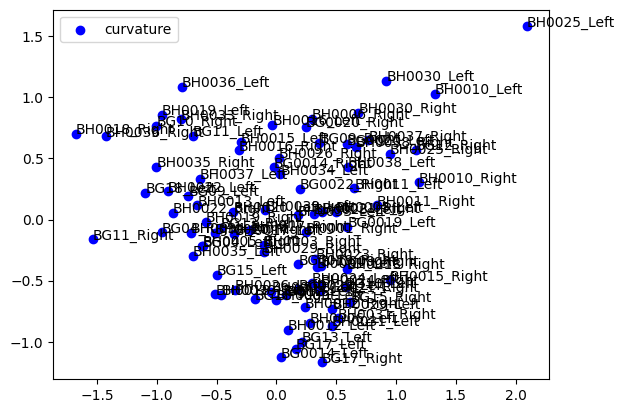

In [183]:
curvature_pca = PCA(n_components=2)
curvature_res = curvature_pca.fit_transform(curvatures)
radius_pca = PCA(n_components=2)
radius_res = radius_pca.fit_transform(radii)
# plt.scatter(radius_res[:, 0], radius_res[:, 1], c='r', label="radius")
plt.scatter(curvature_res[:, 0], curvature_res[:, 1], c='b', label="curvature")
for i in range(len(files)):
    plt.text(curvature_res[i, 0], curvature_res[i, 1], files[i].split("\\")[-1].split(".")[0][:-8])
plt.legend()

(88, 64, 3)


Text(0.5, 1.0, 'align (mean)')

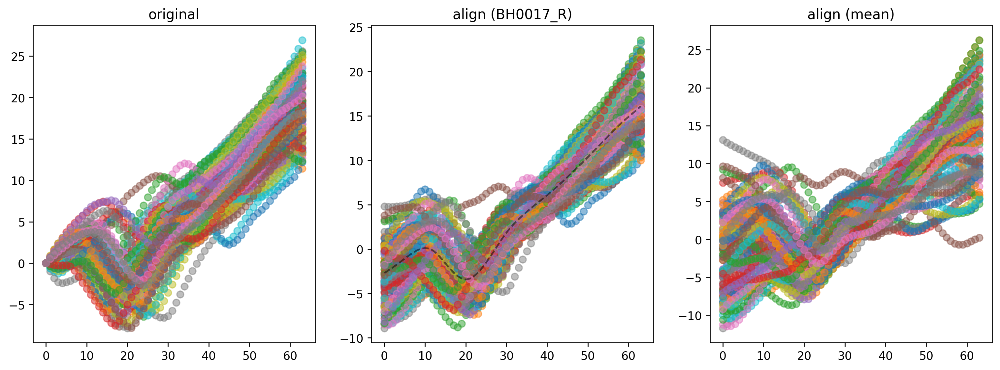

In [184]:
from scipy.spatial.transform import Rotation as R
import numpy as np

def align_icp(curves,base_id=80):
    # 使用第一条曲线作为基准曲线
    new_curves = []
    if base_id > -1:
        base_curve = curves[base_id]
    elif base_id == -1:
        base_curve = np.mean(curves, axis=0)
    
    for i in range(len(curves)):
        curve = curves[i]
        
        # 计算基准曲线和当前曲线的质心
        base_centroid = np.mean(base_curve, axis=0)
        curve_centroid = np.mean(curve, axis=0)
        
        # 将两个曲线移到原点
        base_centered = base_curve - base_centroid
        curve_centered = curve - curve_centroid
        
        # 计算最优旋转
        H = np.dot(base_centered.T, curve_centered)
        U, S, Vt = np.linalg.svd(H)
        R = np.dot(Vt.T, U.T)
        
        if np.linalg.det(R) < 0:
           Vt[-1,:] *= -1
           R = np.dot(Vt.T, U.T)
        
        # 旋转和平移当前曲线以对齐到基准曲线
        # curves[i] = np.dot((curve - curve_centroid), R.T) + base_centroid
        new_curves.append(np.dot((curve - curve_centroid), R.T) + base_centroid)

    return np.array(new_curves)


a_curves = align_icp(curves, base_id=base_id)
a_curves_2 = align_icp(a_curves, base_id=-1)
print (a_curves.shape)
a_curves_mean = np.mean(a_curves, axis=0)
coord_id =2
fig = plt.figure(figsize=(15, 5),dpi=250)
ax = fig.add_subplot(131) 
ax2 =fig.add_subplot(132) 
ax3 =fig.add_subplot(133) 
for i in range(len(a_curves)):
    filename=files[i].split("\\")[-1].split(".")[0][:-8]
    # print (filename)
    curve = curves[i]
    a_curve = a_curves[i]
    a_curve2 = a_curves_2[i]

    ax.plot(curve[:,coord_id], 'o', label='original points', alpha=0.5)
    ax2.plot(a_curve[:,coord_id], 'o', label='align points', alpha=0.5)
    ax3.plot(a_curve2[:,coord_id], 'o', label='align points', alpha=0.5)
    # ax2.text(32,a_curve[:,0][32],str(filename))
ax2.plot(a_curves_mean[:,coord_id], linestyle="--", c="k", label='mean', alpha=0.5)
ax.set_title("original")
ax2.set_title("align (BH0017_R)")
ax3.set_title("align (mean)")

In [185]:
print (a_curves_mean.shape)
np.save("a_curves_mean.npy", a_curves_mean)

(64, 3)


由上面结果可以观察得到  
对BH0017的对齐结果 比 再做一次mean shape并对mean shape的对齐结果 更好。

因此下面我们都用BH0017对齐结果。

# Procrustes

p_curve.shape: (88, 64, 3)


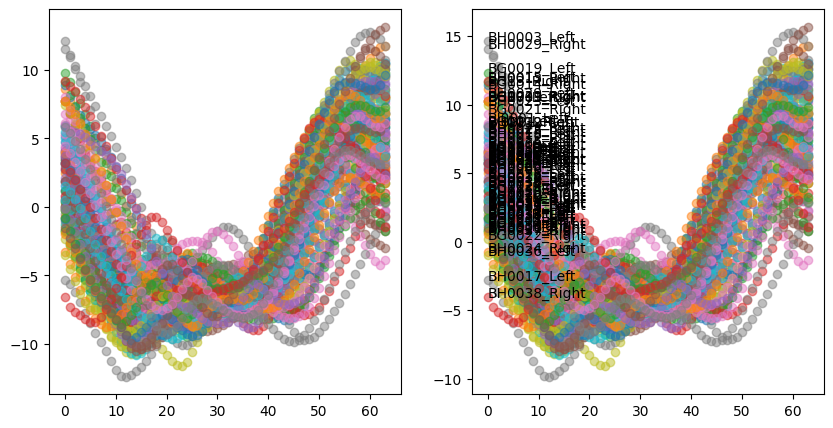

In [186]:
from procrustes import orthogonal

def align_procrustes(curves,base_id=0):
    # 使用第一条曲线作为基准曲线
    base_curve = curves[base_id]
    new_curves = []
    
    for i in range(len(curves)):
        curve = curves[i]
        # print (orthogonal(base_curve, curve, translate=True, scale=True))
        # 对齐当前曲线到基准曲线
        result = orthogonal(base_curve, curve, translate=True, scale=False)
    
        # Z是Procrustes变换后的曲线，用它来更新原始曲线
        # curves[i] = Z
        new_curves.append(result['new_b'])

    return np.array(new_curves)


p_curves = align_procrustes(a_curves,base_id=base_id)

print ("p_curve.shape:", p_curves.shape)

fig = plt.figure(figsize=(10, 5),dpi=100)
ax = fig.add_subplot(121) 
ax2 =fig.add_subplot(122) 
coord_id = 0
for i in range(len(a_curves)):
    filename=files[i].split("\\")[-1].split(".")[0][:-8]
    # print (filename)
    p_curve = p_curves[i]
    a_curve = a_curves[i]

    ax.plot(a_curve[:,coord_id], 'o', label='original points', alpha=0.5)
    ax2.plot(p_curve[:,coord_id], 'o', label='align points', alpha=0.5)
    ax2.text(0,p_curve[:,coord_id][0], str(filename))


In [187]:
curves = p_curves

# interpolation

88


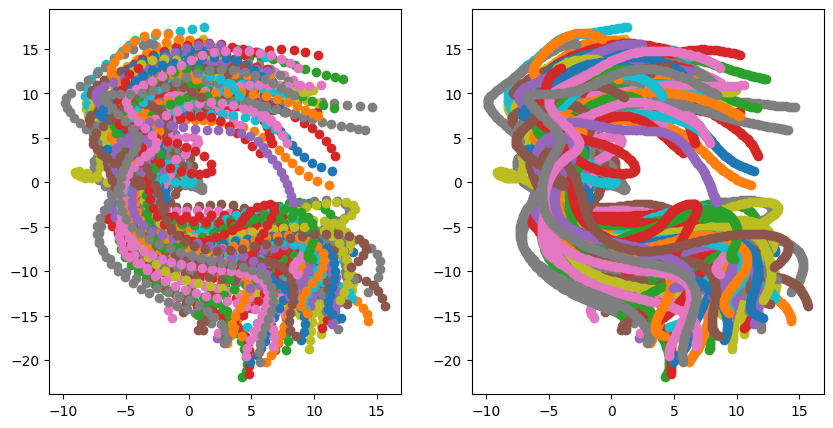

In [188]:
from scipy import interpolate
interpolated_curves = []
fig = plt.figure(figsize=(10, 5))
ax = fig.add_subplot(121) 
ax2 =fig.add_subplot(122) 
for i in range(len(p_curves)):
    curve = p_curves[i]
    max_pt_length = 64*4
    x = np.linspace(0, len(curve), len(curve))
    z2 = np.linspace(0,len(curve), max_pt_length)
    c_interpolation = interpolate.CubicSpline(x, curve)
    curve2 = c_interpolation(z2)
    ax.plot(curve[:,0], curve[:,1], 'o', label='original points')
    ax2.plot(curve2[:,0], curve2[:,1], 'o', label='interpolation points')
    interpolated_curves.append(curve2)


print (len(interpolated_curves))

# SRVF process

align_curve shape: (88, 256, 3)
(88, 256, 3)
generating in directory ./shuffled_srvf_curves/...
making new directory ./shuffled_srvf_curves/230720134305/...


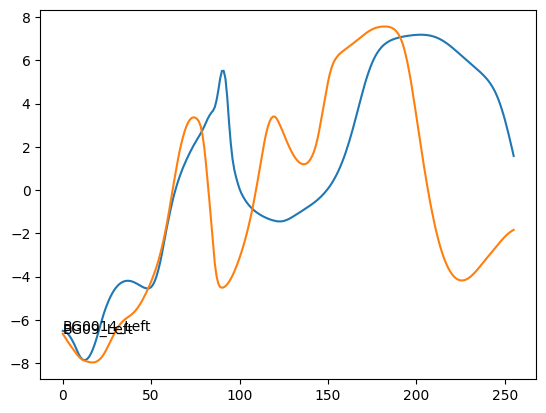

In [189]:
from myvtk.General import mkdir
from datetime import datetime
# 创建一个新的目录来保存变换后的曲线

parametrized_curves = np.zeros_like(interpolated_curves)
# aligned_curves = np.zeros_like(interpolated_curves)
srvf_curves = np.zeros_like(interpolated_curves)
for i in range(len(interpolated_curves)):
    parametrized_curves[i] = arc_length_parametrize(interpolated_curves[i])

aligned_curves = align_curve(parametrized_curves)
print ("align_curve shape:", aligned_curves.shape)

for i in range(len(interpolated_curves)):
    # srvf_curves[i] = calculate_srvf(aligned_curves[i])
    srvf_curves[i] = calculate_srvf(interpolated_curves[i])

# x_mean = np.mean(srvf_curves[:,:,0])
# x_std = np.std(srvf_curves[:,:,0])
# y_mean = np.mean(srvf_curves[:,:,1])
# y_std = np.std(srvf_curves[:,:,1])
# z_mean = np.mean(srvf_curves[:,:,2])
# z_std = np.std(srvf_curves[:,:,2])

# srvf_curves[:,:,0] = zscore(srvf_curves[:,:,0],axis=0)
# srvf_curves[:,:,1] = zscore(srvf_curves[:,:,1],axis=0)
# srvf_curves[:,:,2] = zscore(srvf_curves[:,:,2],axis=0)

for i in range(1):
    plt.plot(srvf_curves[i][:, 0], label="Curve 1")
    plt.text(0,srvf_curves[i][:, 0][0], files[i].split("\\")[-1].split(".")[0][:-8])

print (srvf_curves.shape)

# 获取数据集大小
n = srvf_curves.shape[0]

# 创建一个随机排列的索引
indices = np.random.permutation(n)

# 使用这个索引来重新排列 srvf_curves 和 files
interpolated_curves = np.take(interpolated_curves, indices, axis=0)
srvf_curves = np.take(srvf_curves, indices, axis=0)
files = np.take(files, indices, axis=0)
# sorted_features = np.take(sorted_features, indices, axis=0)
curvatures = np.take(curvatures, indices, axis=0)

for i in range(1):
    plt.plot(srvf_curves[i][:, 0], label="Curve 1")
    plt.text(0,srvf_curves[i][:, 0][0], files[i].split("\\")[-1].split(".")[0][:-8])


save_shuffled_path = mkdir("./","shuffled_srvf_curves")

# 获取当前时间
now = datetime.now()

# 将时间格式化为 'yymmddhhmmss' 格式
formatted_time = now.strftime('%y%m%d%H%M%S')

save_new_shuffle = mkdir(save_shuffled_path,formatted_time)
np.save(save_new_shuffle + "/srvf_curves.npy",srvf_curves,allow_pickle=True)
np.save(save_new_shuffle + "/files.npy",files, allow_pickle=True)
np.save(save_new_shuffle + "/interpolated_curves.npy",interpolated_curves, allow_pickle=True)

最大方差方向: [-0.95671288 -0.08473981 -0.27842347]
投影后的数据形状: (88, 256)


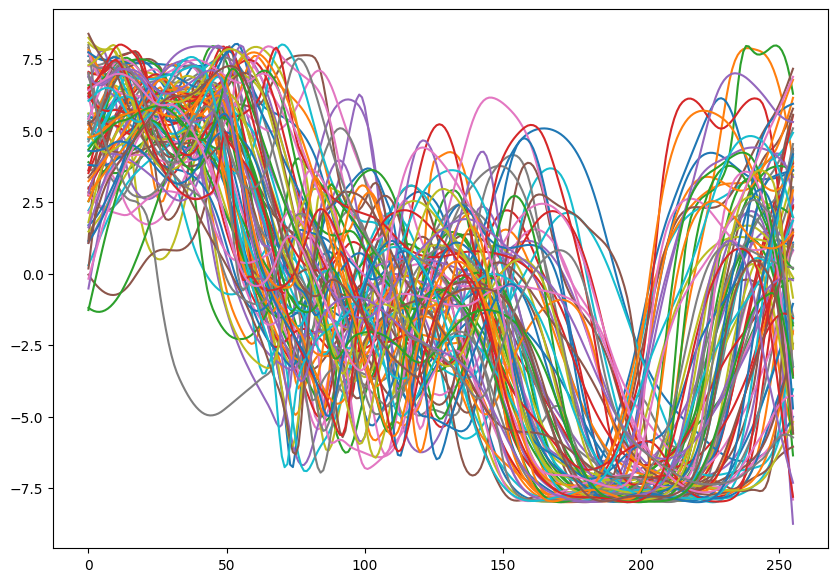

In [190]:
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# 假设你的数据集存在于变量"data"中
data = srvf_curves 

# 调整数据形状以进行PCA
n_curves, n_points, n_dims = data.shape
data_reshaped = data.reshape(n_curves * n_points, n_dims)

# 执行PCA
pca = PCA(n_components=1)
pca.fit(data_reshaped)

# 找到最大方差方向
max_var_direction = pca.components_[0]
print("最大方差方向:", max_var_direction)

# 投影所有曲线到最大方差的方向上
data_projected = np.dot(data, max_var_direction)

print("投影后的数据形状:", data_projected.shape)

# 在最大方差的方向上绘制所有曲线
plt.figure(figsize=(10, 7))
for i in range(n_curves):
    plt.plot(data_projected[i], label=f'Curve {i+1}')
# plt.legend()
plt.show()


In [191]:
# Mean shape.

mean_shape = np.mean(srvf_curves, axis=0)
print (mean_shape.shape)

(256, 3)


In [135]:
# import geomstats.geometry.pre_shape as pre_shape
# import numpy as np

# geodesic_d = []
# # Assuming you have two curves A and B in SRVF representation
# curve_A = np.mean(interpolated_curves, axis=0)
# np.save("./mean_srvf.npy",curve_A,allow_pickle=True)
# for idx in range(len(interpolated_curves)):
#     filename = files[idx].split("\\")[-1].split(".")[0][:-8]
#     curve_B = interpolated_curves[idx]

#     # Define the pre-shape space
#     # Here, 3 is the embedding dimension and 64 is the number of points on the curves
#     points_num=srvf_curves.shape[1]
#     pre_shape_space = pre_shape.PreShapeSpace(points_num, 3)
#     pre_shape_space.metric = pre_shape.PreShapeMetric(3, points_num)
#     # Compute the geodesic distance between the two SRVF curves
#     geodesic_distance = pre_shape_space.metric.dist(curve_A, curve_B)
#     geodesic_d.append(geodesic_distance)

#     print("The geodesic distance between ",filename," and mean shape is: ", geodesic_distance)


In [192]:
import geomstats.geometry.pre_shape as pre_shape
import numpy as np
import numpy as np
import matplotlib.pyplot as plt
import geomstats.geometry.discrete_curves as dc
from geomstats.geometry.euclidean import EuclideanMetric
from geomstats.geometry.hypersphere import HypersphereMetric
from scipy.spatial import distance


geodesic_d = []
# Assuming you have two curves A and B in SRVF representation
curve_A = np.mean(interpolated_curves, axis=0)
for idx in range(len(interpolated_curves)):
    filename = files[idx].split("\\")[-1].split(".")[0][:-8]
    curve_B = interpolated_curves[idx]
    # 创建离散曲线对象
    discrete_curves_space = dc.DiscreteCurves(ambient_manifold=dc.Euclidean(dim=3))
    # 计算测地线距离
    geodesic_distance = discrete_curves_space.metric.dist(curve_A, curve_B)
    geodesic_d.append(geodesic_distance)
    print("The geodesic distance between ",filename," and mean shape is: ", geodesic_distance)


The geodesic distance between  BG09_Left  and mean shape is:  4.6560158428785945
The geodesic distance between  BH0033_Left  and mean shape is:  6.978869787418579
The geodesic distance between  BH0033_Right  and mean shape is:  5.42932484786514
The geodesic distance between  BG17_Right  and mean shape is:  4.551928848516857
The geodesic distance between  BH0029_Left  and mean shape is:  4.82816792618204
The geodesic distance between  BG04_Left  and mean shape is:  3.1447115438528237
The geodesic distance between  BH0035_Right  and mean shape is:  3.1914473672162456
The geodesic distance between  BG12_Left  and mean shape is:  2.901363291800719
The geodesic distance between  BH0036_Left  and mean shape is:  4.738334234523546
The geodesic distance between  BH0012_Left  and mean shape is:  5.924598797745178
The geodesic distance between  BH0010_Left  and mean shape is:  6.006243885794083
The geodesic distance between  BH0005_Left  and mean shape is:  4.394531399371238
The geodesic distanc

(88, 256, 3)


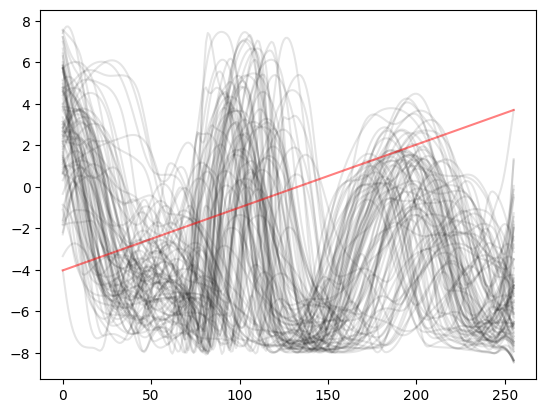

In [193]:
print (srvf_curves.shape)
srvf_min_x = np.min(srvf_curves[:,0,0],axis=0)
srvf_min_y = np.min(srvf_curves[:,0,1],axis=0)
srvf_min_z = np.min(srvf_curves[:,0,2],axis=0)
srvf_max_x = np.max(srvf_curves[:,-1,0],axis=0)
srvf_max_y = np.max(srvf_curves[:,-1,1],axis=0)
srvf_max_z = np.max(srvf_curves[:,-1,2],axis=0)
straight_line = np.array(np.zeros_like(srvf_curves[0]))
straight_line[:,0] = np.linspace(srvf_min_x,srvf_max_x,srvf_curves.shape[1])
straight_line[:,1] = np.linspace(srvf_min_y,srvf_max_y,srvf_curves.shape[1])
straight_line[:,2] = np.linspace(srvf_min_z,srvf_max_z,srvf_curves.shape[1])
for c in srvf_curves:
    plt.plot(c[:,1],c="k",alpha=0.1)
plt.plot(straight_line[:,1],c="r",alpha=0.5)

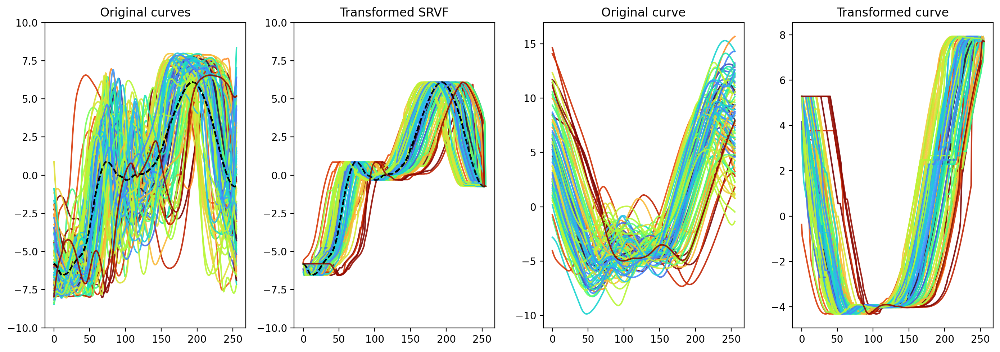

In [194]:
from fastdtw import fastdtw
from scipy.spatial.distance import euclidean
import numpy as np
import matplotlib
fig, ax = plt.subplots(1, 4, figsize=(14, 5),dpi=200)
Q2 = mean_shape
# Q2 = straight_line
cmap = matplotlib.cm.get_cmap('turbo')

warp_function_list = []
transformed_Q1_list = []

coord_id = 0
# peak_x_max = 0 
# peak_x_min= len(srvf_curves[0])
peaks = []
geo_colors = []

for idx in range(len(srvf_curves)):
    # 假设Q1和Q2是两个已经计算好的SRVF，shape都为（64,3）
    # 以下是随机生成的示例数据
    geo_color = cmap((geodesic_d[idx]-min(geodesic_d))/(max(geodesic_d)-min(geodesic_d)))
    geo_colors.append(geo_color)
    Q1 = srvf_curves[idx]
    

    # Step 1: 对SRVF进行动态时间规整
    distance, path = fastdtw(Q1, Q2, dist=euclidean)

    # Step 2: 计算最优变换
    # path是一个包含配对索引的列表，我们可以使用它来创建变换后的曲线
    # 我们假设Q1是我们想要对齐的曲线，Q2是参考曲线
    transformed_Q1 = np.zeros(Q1.shape)
    transformed_L1 = np.zeros(Q1.shape)
    
    for pair in path:
        transformed_Q1[pair[0]] = Q2[pair[1]] # 原本是Q1[pair[1]]
        transformed_L1[pair[0]] = np.mean(interpolated_curves,axis=0)[pair[1]] 
        
    # peak_x_max = max(np.argmax(transformed_Q1[:,0]),peak_x_max)
    # peak_x_min = min(np.argmax(transformed_Q1[:,0]),peak_x_max)
    peaks.append(np.argmax(transformed_Q1[:,0]))
    # 这个transformed_Q1现在是变换后的SRVF，你可以将其转换回原始曲线空间
    # 将path转化为numpy array，以便于处理
    path_array = np.array(path)

    # 初始化warp function为一个与Q1同样长度的零向量
    warp_function = np.zeros(Q1.shape[0])

    # 根据path定义warp function
    # 对于Q1中的每一个点，warp function的值就是与之对应的Q2中的点的索引
    for i in range(path_array.shape[0]):
        warp_function[path_array[i, 0]] = path_array[i, 1]

    # 因为warp function可能不是连续的，所以我们可以通过插值来得到一个连续的warp function
    # 这里我们用线性插值
    continuous_warp_function = np.interp(np.arange(Q1.shape[0]), path_array[:,0], path_array[:,1])
    warp_function_list.append(continuous_warp_function)
    transformed_Q1_list.append(transformed_Q1)

    ax[0].plot(Q1[:,coord_id], label="Q1",color=geo_color,alpha=0.9)
    ax[0].plot(Q2[:,coord_id], label="Q2",color="k",alpha=0.5,linestyle="--")
    ax[0].set_title("Original curves")
    ax[1].plot(transformed_Q1[:,coord_id], label="Transformed Q1",color=geo_color,alpha=0.9)
    ax[1].plot(Q2[:,coord_id], label="Q2",color="k",alpha=0.5,linestyle="--")
    ax[1].set_title("Transformed SRVF")
    #ax[2].plot(continuous_warp_function, label="Warp function",color=geo_color,alpha=0.9)
    #ax[2].set_title("Warp function")
    ax[2].plot(interpolated_curves[idx][:,coord_id], label="Original curve",color=geo_color,alpha=0.9)
    ax[2].set_title("Original curve")
    ax[3].plot(transformed_L1[:,coord_id], label="Transformed curve",color=geo_color,alpha=0.9)
    ax[3].set_title("Transformed curve")
    for j in range(2):
        ax[j].set_ylim(-10,10)
plt.tight_layout()
plt.show()


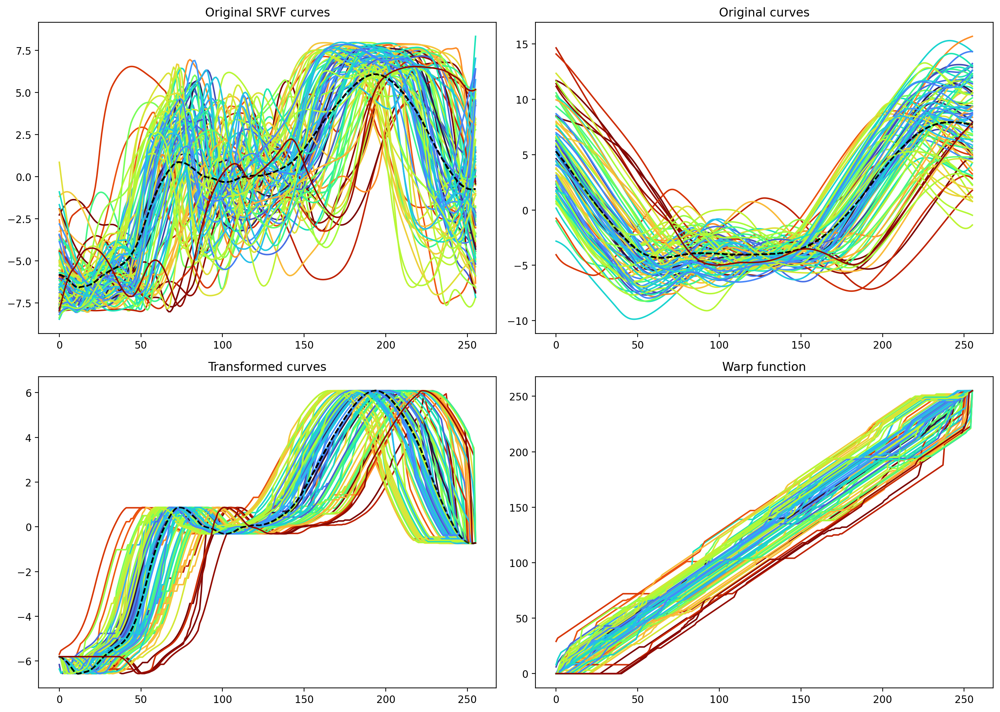

In [195]:

def percentileofscore(a, score):
    return np.sum(a <= score) / len(a)
coord_id = 0
colors = []
# fig, ax = plt.subplots(1, 3)
fig, ax = plt.subplots(2, 2, figsize=(14, 10),dpi=200)
Q2 = mean_shape

for idx in range(len(srvf_curves)):
    #print (idx)
    Q1 = srvf_curves[idx]
    transformed_Q1 = transformed_Q1_list[idx]
    peak_x = np.argmax(transformed_Q1[:,0])
    color = geo_colors[idx]
    #color = cmap(percentileofscore(peaks,peak_x))
    #colors.append(color)

    continuous_warp_function = warp_function_list[idx]


    ax[0,0].plot(Q1[:,coord_id], label="Q1",color=color)
    ax[0,0].plot(Q2[:,coord_id], label="Q2",color="k",alpha=0.5,linestyle="--")
    ax[0,0].set_title("Original SRVF curves")
    ax[0,1].plot(interpolated_curves[idx][:,coord_id], label="Q1",color=color)
    ax[0,1].plot(np.mean(interpolated_curves,axis=0)[:,coord_id],color="k",alpha=0.5,linestyle="--")
    ax[0,1].set_title("Original curves")
    ax[1,0].plot(transformed_Q1[:,coord_id], label="Transformed Q1",color=color)
    ax[1,0].plot(Q2[:,coord_id], label="Q2",color="k",alpha=0.5,linestyle="--")
    ax[1,0].set_title("Transformed curves")
    ax[1,1].plot(continuous_warp_function, label="Warp function",color=color)
    ax[1,1].set_title("Warp function")
#
plt.tight_layout()
plt.show()


(88, 256)


<function matplotlib.pyplot.tight_layout(*, pad=1.08, h_pad=None, w_pad=None, rect=None)>

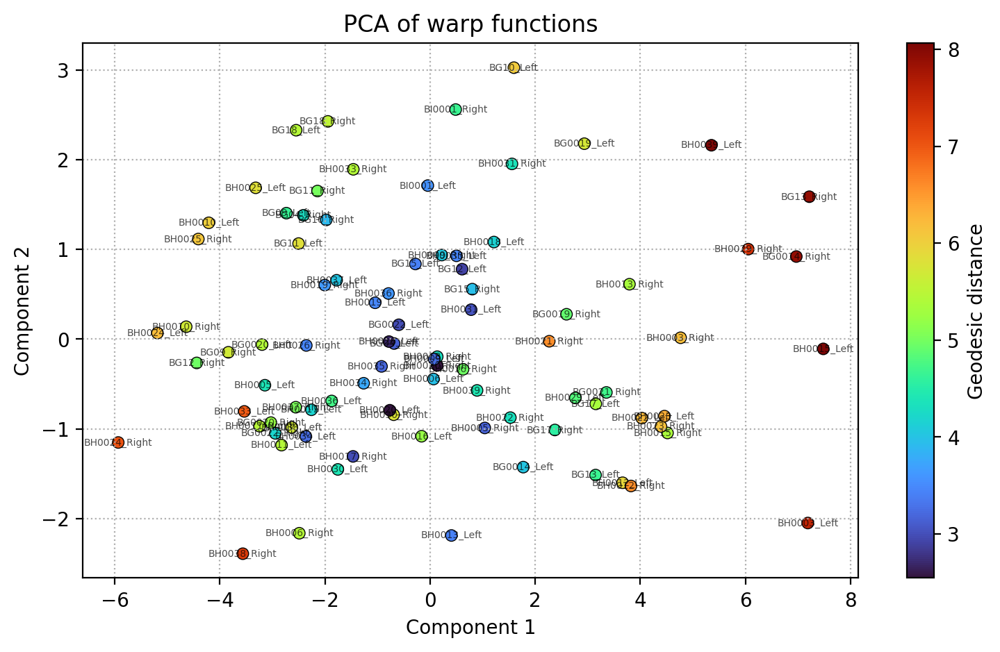

In [196]:
pca = PCA(n_components=6)

warp_function_array = np.array(warp_function_list)
print (warp_function_array.shape)

for i in range(warp_function_array.shape[1]):
    warp_function_array[:,i] = (warp_function_array[:,i] - min(warp_function_array[:,i]))/(max(warp_function_array[:,i]) - min(warp_function_array[:,i])+0.001)


result = pca.fit_transform(warp_function_array)
standard_pca = pca.transform([np.arange(256)])
fig, ax = plt.subplots(1, 1, figsize=(9, 5),dpi=200)
#sc = ax.scatter(result[:, 0], result[:, 1],c=cmap((geodesic_d-min(geodesic_d))/(max(geodesic_d)-min(geodesic_d))),alpha=0.5)
sc = ax.scatter(result[:, 0], result[:, 1],c=geodesic_d,alpha=0.99,cmap=cmap,edgecolors="k",linewidths=0.5)
# sc = ax.scatter(result[:, 0], result[:, 1],c=sorted_features[:,8],alpha=0.5,cmap=cmap)
cbar = plt.colorbar(sc)
for i in range(len(files)):
    filename = files[i].split("\\")[-1].split(".")[0][:-8]
    plt.text(result[i, 0], result[i, 1], filename, fontsize=5, ha='center', va='center',alpha=0.7)
ax.set_xlabel('Component 1')
ax.set_ylabel('Component 2')
ax.set_title("PCA of warp functions")
# ax.scatter(standard_pca[:, 0], standard_pca[:, 1],c="k",marker="x",s=50,alpha=0.5)
ax.grid(linestyle=":")
cbar.set_label('Geodesic distance')
plt.tight_layout

In [197]:
pca_dist = []

for i in range(len(files)):
    filename = files[i].split("\\")[-1].split(".")[0][:-8]
    # plt.scatter(i, np.linalg.norm([result[i, 0], result[i, 1]]))
    pca_dist.append(np.linalg.norm([result[i, 0], result[i, 1]]))
correlation_matrix = np.corrcoef(pca_dist, geodesic_d)   
correlation = correlation_matrix[0, 1]
print("相关性系数：", correlation)

相关性系数： 0.854248731209487


In [198]:
test_srvf_curves = srvf_curves[0:22]
# valid_srvf_curves = srvf_curves[10:24]
train_srvf_curves = srvf_curves[22:]

test_files = files[0:22]
# valid_files = files[10:24]
train_files = files[22:]

test_curves = interpolated_curves[0:22]
# valid_curves = interpolated_curves[10:24]
train_curves = interpolated_curves[22:] 

test_curvature = curvatures[0:22]
# valid_curvature = curvatures[10:24]
train_curvature = curvatures[22:]

train_geodesic必须重新算，而不能从geodesic_d中截取，因为mean shape改变了

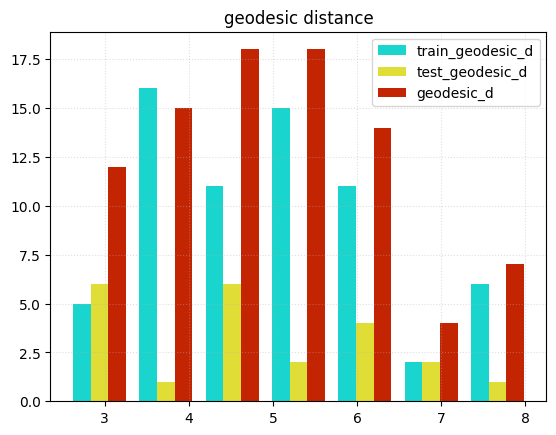

In [199]:
train_geodesic_d = []
test_geodesic_d = []
discrete_curves_space = dc.DiscreteCurves(ambient_manifold=dc.Euclidean(dim=3))
# Assuming you have two curves A and B in SRVF representation
curve_A = np.mean(train_curves, axis=0)
for idx in range(len(train_curves)):
    filename = train_files[idx].split("\\")[-1].split(".")[0][:-8]
    curve_B = train_curves[idx]
    # 计算测地线距离
    geodesic_distance = discrete_curves_space.metric.dist(curve_A, curve_B)
    train_geodesic_d.append(geodesic_distance)


for idx in range(len(test_curves)):
    filename = test_files[idx].split("\\")[-1].split(".")[0][:-8]
    curve_B = test_curves[idx]
    geodesic_distance = discrete_curves_space.metric.dist(curve_A, curve_B)
    test_geodesic_d.append(geodesic_distance)

fig = plt.figure()
ax = fig.add_subplot(111)

ax.hist([train_geodesic_d,test_geodesic_d, geodesic_d], bins=7,
        label=['train_geodesic_d',"test_geodesic_d", 'geodesic_d'],
        color=[cmap(0.3), cmap(0.6), cmap(0.9)], )


ax.set_title("geodesic distance")
ax.grid(linestyle=":", alpha=0.4)
plt.legend()

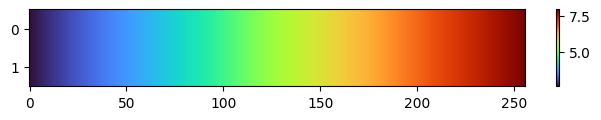

In [200]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# 使用你的数据 train_geodesic_d 创建一个颜色标准化器
norm = plt.Normalize(min(train_geodesic_d), max(train_geodesic_d))

# 使用标准化器和 colormap 创建一个 ScalarMappable
sm = cm.ScalarMappable(norm=norm, cmap=cmap)

# 获取每一条线的颜色
train_line_colors = sm.to_rgba(train_geodesic_d)
test_line_colors = sm.to_rgba(test_geodesic_d)

# 创建一个新的图像并添加一个子图
fig, ax = plt.subplots(figsize=(8, 1), dpi=100)

# 使用 ScalarMappable 的 cmap 生成一个颜色梯度条
gradient = np.linspace(0, 1, 256)
gradient = np.vstack((gradient, gradient))

# 使用 imshow 显示颜色梯度条
ax.imshow(gradient, aspect='auto', cmap=sm.cmap)

# 添加 colorbar
plt.colorbar(sm)

plt.show()

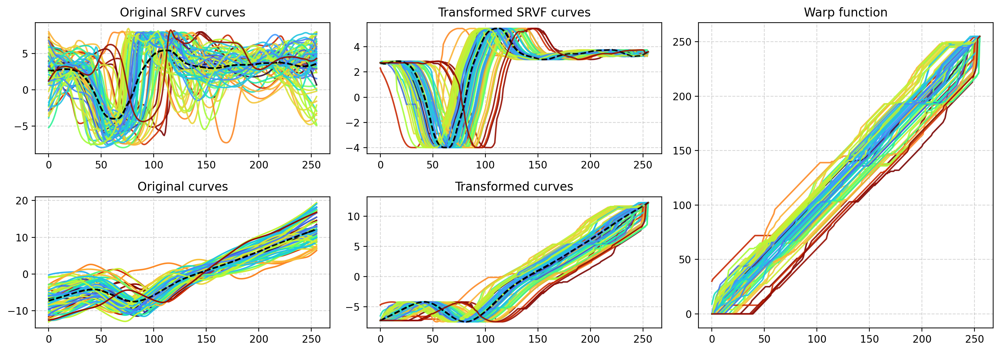

In [201]:
from fastdtw import fastdtw
from scipy.spatial.distance import euclidean
import numpy as np
import matplotlib
import matplotlib.gridspec as gridspec
gsp = gridspec.GridSpec(2, 3, height_ratios=[1,1])
# fig, ax = plt.subplots(2, 3, figsize=(14, 5),dpi=200)
fig = plt.figure(figsize=(14, 5), dpi=200)

ax1 = plt.subplot(gsp[0, 0])
ax2 = plt.subplot(gsp[0, 1])
ax3 = plt.subplot(gsp[0, 2])
ax4 = plt.subplot(gsp[1, 0])
ax5 = plt.subplot(gsp[1, 1])
ax6 = plt.subplot(gsp[:, 2])  

train_mean_srvf = np.mean(train_srvf_curves, axis=0)
train_mean_curve = np.mean(train_curves, axis=0)
Q2 = train_mean_srvf

cmap = matplotlib.cm.get_cmap('turbo')

train_warp_function_list = []
train_transformed_Q1_list = []

coord_id = 2

for idx in range(len(train_srvf_curves)):
    Q1 = train_srvf_curves[idx]
    
    # Step 1: 对SRVF进行动态时间规整
    distance, path = fastdtw(Q1, Q2, dist=euclidean)

    # Step 2: 计算最优变换
    # path是一个包含配对索引的列表，我们可以使用它来创建变换后的曲线
    # 我们假设Q1是我们想要对齐的曲线，Q2是参考曲线
    train_transformed_Q1 = np.zeros(Q1.shape)
    train_transformed_L1 = np.zeros(Q1.shape)
    
    for pair in path:
        train_transformed_Q1[pair[0]] = Q2[pair[1]] # 原本是Q1[pair[1]]
        train_transformed_L1[pair[0]] = train_mean_curve[pair[1]] # 原本是Q1[pair[1]]

    # 这个transformed_Q1现在是变换后的SRVF，你可以将其转换回原始曲线空间
    # 将path转化为numpy array，以便于处理
    path_array = np.array(path)

    # 初始化warp function为一个与Q1同样长度的零向量
    warp_function = np.zeros(Q1.shape[0])

    # 根据path定义warp function
    # 对于Q1中的每一个点，warp function的值就是与之对应的Q2中的点的索引
    for i in range(path_array.shape[0]):
        warp_function[path_array[i, 0]] = path_array[i, 1]

    # 因为warp function可能不是连续的，所以我们可以通过插值来得到一个连续的warp function
    # 这里我们用线性插值
    train_continuous_warp_function = np.interp(np.arange(Q1.shape[0]), path_array[:,0], path_array[:,1])
    train_warp_function_list.append(train_continuous_warp_function)
    train_transformed_Q1_list.append(train_transformed_Q1)

    ax1.plot(Q1[:,coord_id], label="Q1",alpha=0.9,color=train_line_colors[idx])
    ax1.plot(Q2[:,coord_id], label="Q2",color="k",alpha=0.5,linestyle="--")
    ax1.set_title("Original SRFV curves")
    ax2.plot(train_transformed_Q1[:,coord_id], 
               label="Transformed Q1",
               alpha=0.9,
               color=train_line_colors[idx])
    ax2.plot(Q2[:,coord_id], label="Q2",color="k",alpha=0.5,linestyle="--")
    ax2.set_title("Transformed SRVF curves")
    ax6.plot(train_continuous_warp_function, label="Warp function",alpha=0.9,color=train_line_colors[idx])
    ax6.set_title("Warp function")

    ax4.plot(train_curves[idx][:,coord_id], label="Q1",color=train_line_colors[idx])
    ax4.plot(np.mean(train_curves,axis=0)[:,coord_id],color="k",alpha=0.5,linestyle="--")
    ax4.set_title("Original curves")
    ax5.plot(train_transformed_L1[:,coord_id], 
               label="Transformed Q1",
               alpha=0.9,
               color=train_line_colors[idx])
    ax5.plot(train_mean_curve[:,coord_id],color="k",alpha=0.5,linestyle="--")
    ax5.set_title("Transformed curves")
for ax in [ax1,ax2,ax3,ax4,ax5,ax6]:
    ax.grid(linestyle="--",alpha=0.5)
plt.tight_layout()
plt.show()


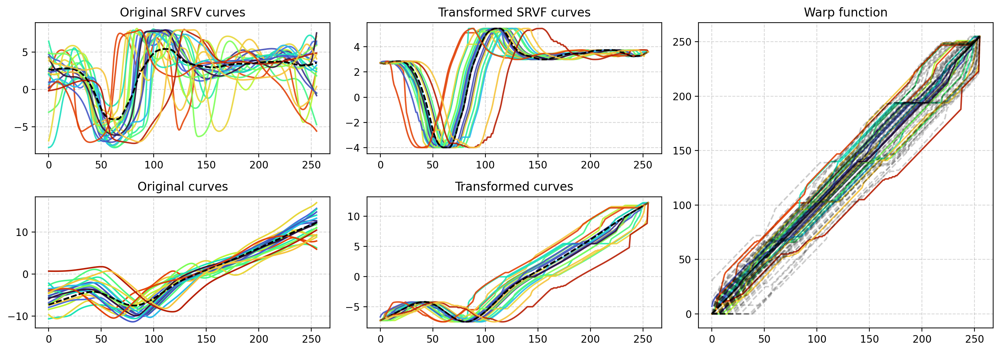

In [202]:
from fastdtw import fastdtw
from scipy.spatial.distance import euclidean
import numpy as np
import matplotlib
import matplotlib.gridspec as gridspec
gsp = gridspec.GridSpec(2, 3, height_ratios=[1,1])
# fig, ax = plt.subplots(2, 3, figsize=(14, 5),dpi=200)
fig = plt.figure(figsize=(14, 5), dpi=200)

ax1 = plt.subplot(gsp[0, 0])
ax2 = plt.subplot(gsp[0, 1])
ax3 = plt.subplot(gsp[0, 2])
ax4 = plt.subplot(gsp[1, 0])
ax5 = plt.subplot(gsp[1, 1])
ax6 = plt.subplot(gsp[:, 2])  

train_mean_srvf = np.mean(train_srvf_curves, axis=0)
train_mean_curve = np.mean(train_curves, axis=0)
Q2 = train_mean_srvf

cmap = matplotlib.cm.get_cmap('turbo')

test_warp_function_list = []
test_transformed_Q1_list = []

coord_id = 2

for idx in range(len(test_srvf_curves)):
    Q1 = test_srvf_curves[idx]
    
    # Step 1: 对SRVF进行动态时间规整
    distance, path = fastdtw(Q1, Q2, dist=euclidean)

    # Step 2: 计算最优变换
    # path是一个包含配对索引的列表，我们可以使用它来创建变换后的曲线
    # 我们假设Q1是我们想要对齐的曲线，Q2是参考曲线
    test_transformed_Q1 = np.zeros(Q1.shape)
    test_transformed_L1 = np.zeros(Q1.shape)
    
    for pair in path:
        test_transformed_Q1[pair[0]] = Q2[pair[1]] # 原本是Q1[pair[1]]
        test_transformed_L1[pair[0]] = train_mean_curve[pair[1]] # 原本是Q1[pair[1]]

    # 这个transformed_Q1现在是变换后的SRVF，你可以将其转换回原始曲线空间
    # 将path转化为numpy array，以便于处理
    path_array = np.array(path)

    # 初始化warp function为一个与Q1同样长度的零向量
    warp_function = np.zeros(Q1.shape[0])

    # 根据path定义warp function
    # 对于Q1中的每一个点，warp function的值就是与之对应的Q2中的点的索引
    for i in range(path_array.shape[0]):
        warp_function[path_array[i, 0]] = path_array[i, 1]

    # 因为warp function可能不是连续的，所以我们可以通过插值来得到一个连续的warp function
    # 这里我们用线性插值
    test_continuous_warp_function = np.interp(np.arange(Q1.shape[0]), path_array[:,0], path_array[:,1])
    test_warp_function_list.append(test_continuous_warp_function)
    test_transformed_Q1_list.append(test_transformed_Q1)

    ax1.plot(Q1[:,coord_id], label="Q1",alpha=0.9,color=test_line_colors[idx])
    ax1.plot(Q2[:,coord_id], label="Q2",color="k",alpha=0.5,linestyle="--")
    ax1.set_title("Original SRFV curves")
    ax2.plot(test_transformed_Q1[:,coord_id], 
               label="Transformed Q1",
               alpha=0.9,
               color=test_line_colors[idx])
    ax2.plot(Q2[:,coord_id], label="Q2",color="k",alpha=0.5,linestyle="--")
    ax2.set_title("Transformed SRVF curves")
    ax6.plot(test_continuous_warp_function, label="Warp function",alpha=0.9,color=test_line_colors[idx])
    ax6.set_title("Warp function")

    ax4.plot(test_curves[idx][:,coord_id], label="Q1",color=test_line_colors[idx])
    ax4.plot(np.mean(train_curves,axis=0)[:,coord_id],color="k",alpha=0.5,linestyle="--")
    ax4.set_title("Original curves")
    ax5.plot(test_transformed_L1[:,coord_id], 
               label="Transformed Q1",
               alpha=0.9,
               color=test_line_colors[idx])
    ax5.plot(train_mean_curve[:,coord_id],color="k",alpha=0.5,linestyle="--")
    ax5.set_title("Transformed curves")
for ax in [ax1,ax2,ax3,ax4,ax5,ax6]:
    ax.grid(linestyle="--",alpha=0.5)
    
for i in range(len(train_warp_function_list)):
    ax6.plot(train_warp_function_list[i], label="Warp function",alpha=0.2,c="k",linestyle="--")

plt.tight_layout()
plt.show()


(66, 256)
(22, 256)
(66, 256)
测试集相关性系数： 0.8310733133635633
训练集相关性系数： 0.8892002167090262


Text(0.18, 0.95, 'correlation: 0.889')

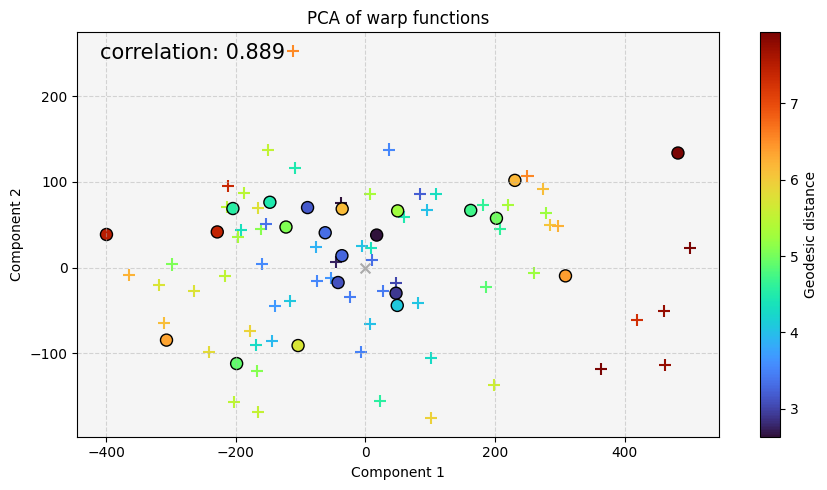

In [206]:
train_warp_function_array = np.array(train_warp_function_list)
test_warp_function_array = np.array(test_warp_function_list)
# plt.imshow(train_warp_function_array, cmap=cmap)
print (train_warp_function_array.shape)
print (test_warp_function_array.shape)

pca = PCA(n_components=6)

print (train_warp_function_array.shape)

# for i in range(test_warp_function_array.shape[1]):
#     test_warp_function_array[:,i] = (test_warp_function_array[:,i] - min(train_warp_function_array[:,i]))/(0.0001 + max(train_warp_function_array[:,i]) - min(train_warp_function_array[:,i]))
# for i in range(train_warp_function_array.shape[1]):
#     train_warp_function_array[:,i] = (train_warp_function_array[:,i] - min(train_warp_function_array[:,i]))/(0.0001 + max(train_warp_function_array[:,i]) - min(train_warp_function_array[:,i]))



train_result = pca.fit_transform(train_warp_function_array)
# aneurisk_result = pca.transform(np.load("./aneuriskwarp_function_array.npy"))
test_result = pca.transform(test_warp_function_array)

fig, ax = plt.subplots(1, 1, figsize=(9, 5),dpi=100)
#sc = ax.scatter(result[:, 0], result[:, 1],c=cmap((geodesic_d-min(geodesic_d))/(max(geodesic_d)-min(geodesic_d))),alpha=0.5)
aneu_geodesic_d=np.load("./aneurisk_geodesic_d.npy")
sc = ax.scatter(train_result[:, 0], train_result[:, 1],
                c = train_geodesic_d,
                s = 75,
                # s = np.square(train_geodesic_d)*0.01,
                marker = "+",
                alpha=1,
                cmap=cmap)
ax.scatter(test_result[:, 0], test_result[:, 1],
                c = test_geodesic_d,
                edgecolors="k",
                s = 75,
                # s = np.square(train_geodesic_d)*0.01,
                marker = "o",
                alpha=1,
                cmap=cmap)
cbar = plt.colorbar(sc)
# for i in range(len(train_files)):
#     filename = train_files[i].split("\\")[-1].split(".")[0][:-8]
#     plt.text(train_result[i, 0], train_result[i, 1], filename, 
#              fontsize=8, 
#              ha='center', va='top')
ax.set_xlabel('Component 1')
ax.set_ylabel('Component 2')
ax.set_title("PCA of warp functions")
ax.grid(linestyle="--",alpha=0.5)
ax.set_facecolor("whitesmoke")
ax.scatter(0,0,c="k",marker="x",s=50,alpha=0.3)
cbar.set_label('Geodesic distance')

plt.tight_layout()
ax.axis('equal')
ax.axis('tight')

test_pca_dist = []
for i in range(test_result.shape[0]):
    # test_pca_dist.append(np.linalg.norm([test_result[i, 0], test_result[i, 1]]))
    test_pca_dist.append(np.linalg.norm(test_result[i]))
correlation_matrix = np.corrcoef(test_pca_dist, test_geodesic_d)   
correlation = correlation_matrix[0, 1]
print("测试集相关性系数：", correlation)

train_pca_dist = []
for i in range(train_result.shape[0]):
    # train_pca_dist.append(np.linalg.norm([train_result[i, 0], train_result[i, 1]]))
    train_pca_dist.append(np.linalg.norm(train_result[i]))
correlation_matrix = np.corrcoef(train_pca_dist, train_geodesic_d)
correlation = correlation_matrix[0, 1]
print("训练集相关性系数：", correlation)
ax.text(.18,0.95,"correlation: "+str(round(correlation_matrix[0,1],3)),fontsize=15,ha="center",va="center",transform=ax.transAxes)

曲率PCA在train集上的相关系数： 0.12140316604736336


Text(0.18, 0.95, 'correlation: 0.121')

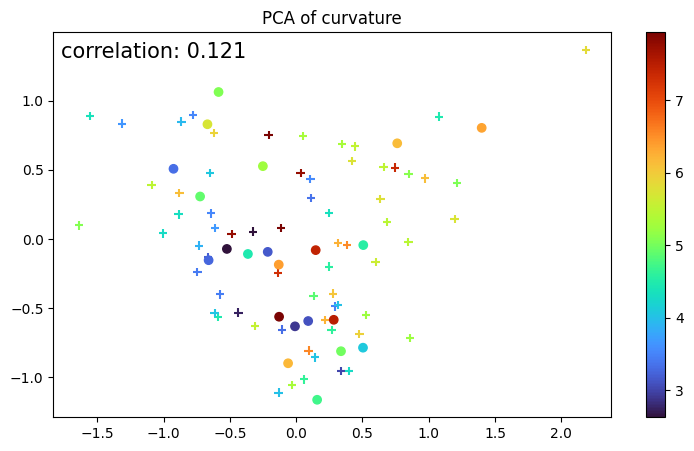

In [207]:
# 和curvature PCA的比较

curvature_pca = PCA(n_components=6)
train_curvature_result = curvature_pca.fit_transform(train_curvature)
test_curvature_result = curvature_pca.transform(test_curvature)

fig, ax = plt.subplots(1, 1, figsize=(9, 5),dpi=100)
#sc = ax.scatter(result[:, 0], result[:, 1],c=cmap((geodesic_d-min(geodesic_d))/(max(geodesic_d)-min(geodesic_d))),alpha=0.5)   
sc = ax.scatter(train_curvature_result[:, 0], train_curvature_result[:, 1],
                c = train_geodesic_d,cmap=cmap,
                marker="+")
ax.scatter(test_curvature_result[:, 0], test_curvature_result[:, 1],
                c = test_geodesic_d,cmap=cmap,
                marker="o")
ax.set_title("PCA of curvature")
cbar = plt.colorbar(sc)

pca_curvature_dist = []
for i in range(train_curvature_result.shape[0]):
    # pca_curvature_dist.append(np.linalg.norm([train_curvature_result[i, 0], train_curvature_result[i, 1]]))
    pca_curvature_dist.append(np.linalg.norm(train_curvature_result[i]))

correlation_matrix = np.corrcoef(pca_curvature_dist, train_geodesic_d)
print ("曲率PCA在train集上的相关系数：", correlation_matrix[0,1])
ax.text(.18,0.95,"correlation: "+str(round(correlation_matrix[0,1],3)),fontsize=15,ha="center",va="center",transform=ax.transAxes)

coodinate PCA在train集上的相关系数： 0.662912527578693


Text(0.18, 0.95, 'correlation: 0.663')

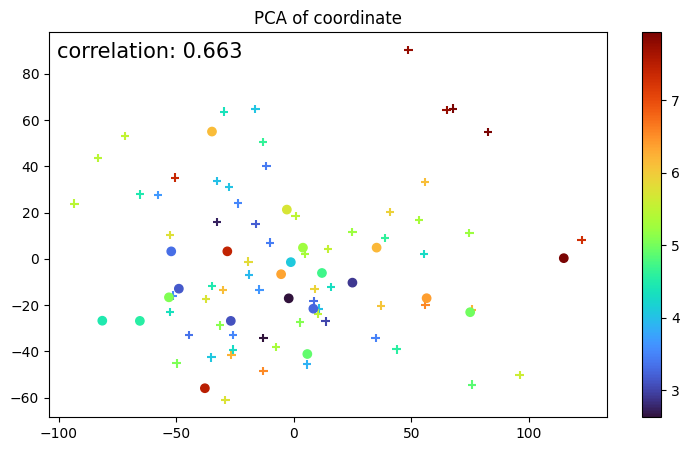

In [208]:
# 和coordinate PCA的比较

coord_pca = PCA(n_components=6)
train_coord_result = coord_pca.fit_transform(train_curves.reshape(train_curves.shape[0],-1))
test_coord_result = coord_pca.transform(test_curves.reshape(test_curves.shape[0],-1))

fig, ax = plt.subplots(1, 1, figsize=(9, 5),dpi=100)

sc = ax.scatter(train_coord_result[:, 0], train_coord_result[:, 1],
                c = train_geodesic_d,cmap=cmap,
                marker="+")
ax.scatter(test_coord_result[:, 0], test_coord_result[:, 1],
                c = test_geodesic_d,cmap=cmap)
ax.set_title("PCA of coordinate")
cbar = plt.colorbar(sc)

pca_coord_dist = []
for i in range(train_coord_result.shape[0]):
    # pca_coord_dist.append(np.linalg.norm([train_coord_result[i, 0], train_coord_result[i, 1]]))
    pca_coord_dist.append(np.linalg.norm(train_coord_result[i]))

correlation_matrix = np.corrcoef(pca_coord_dist, train_geodesic_d)
print ("coodinate PCA在train集上的相关系数：", correlation_matrix[0,1])
ax.text(.18,0.95,"correlation: "+str(round(correlation_matrix[0,1],3)),fontsize=15,ha="center",va="center",transform=ax.transAxes)

### Chapter
- Development of ... frame work
- PCA-->geometry paramter

使用validation data来pca.transform, 得到新图
- 之前需要计算valid data到train mean的geodesic距离

(88, 512, 3)


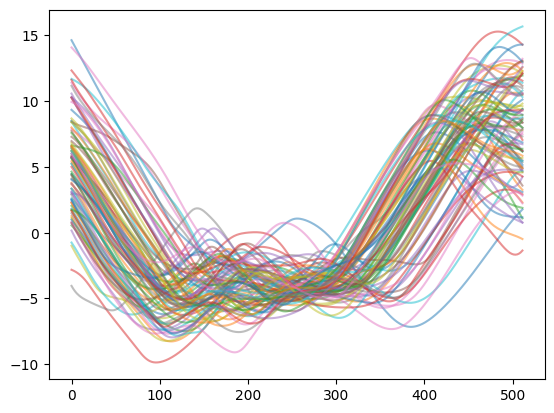

In [209]:
from scipy.interpolate import interp1d
import geomstats.backend as gs

def create_parametrized_curve(curve):
    # 我们首先需要生成一个表示参数的数组
    parameters = np.linspace(0, 1, len(curve))

    # 然后我们对每一个维度进行插值
    interp_funcs = [interp1d(parameters, curve[:, dim]) for dim in range(curve.shape[1])]

    # 最后我们可以定义一个参数化的函数，该函数接受一组参数值并返回对应的曲线点
    def parametrized_curve(params):
        return gs.transpose(gs.array([func(params) for func in interp_funcs]))

    return parametrized_curve


# 假设 curves 是一个列表，其中包含了你的所有曲线
parametrized_curves = [create_parametrized_curve(curve) for curve in interpolated_curves]

# 现在 parametrized_curves 是一个包含了参数化函数的列表，你可以使用这些函数来生成新的曲线点
# 例如，你可以在 20 个采样点上生成新的曲线点
sampling_points = gs.linspace(0.0, 1.0, 512)
new_curves = [param_curve(sampling_points) for param_curve in parametrized_curves]
new_curves = np.array(new_curves)
print (new_curves.shape)
for i in range(new_curves.shape[0]):
    plt.plot(new_curves[i,:,0],alpha=0.5)

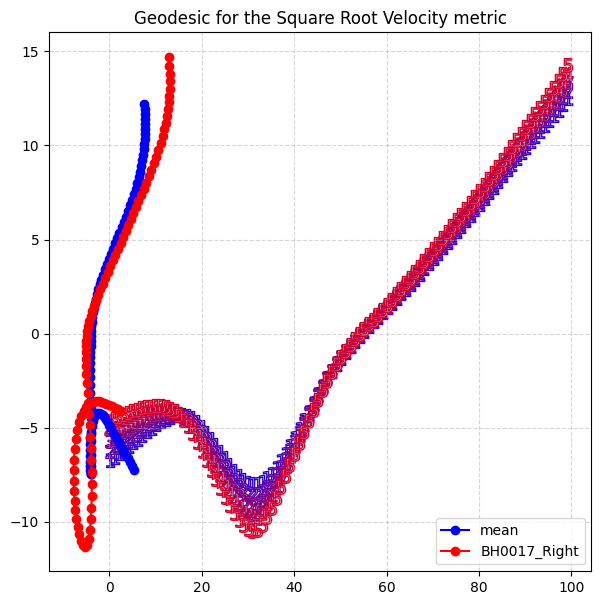

In [216]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

import geomstats.backend as gs
from geomstats.geometry.euclidean import Euclidean
from geomstats.geometry.discrete_curves import DiscreteCurves

r2 = Euclidean(dim=3)
k_sampling_points = 100

curves_r2 = DiscreteCurves(ambient_manifold=r2, k_sampling_points=k_sampling_points)
# a = 52
b = 16
parametrized_curve_a = create_parametrized_curve(np.mean(train_curves, axis=0))
parametrized_curve_b = create_parametrized_curve(interpolated_curves[b])
# filename_a = files[a].split("\\")[-1].split(".")[0][:-8]
filename_a = "mean"
filename_b = files[b].split("\\")[-1].split(".")[0][:-8]

sampling_points = gs.linspace(0.0, 1.0, k_sampling_points)
curve_a = parametrized_curve_a(sampling_points)
curve_b = parametrized_curve_b(sampling_points)

geod_fun = curves_r2.metric.geodesic(curve_a, curve_b)

n_times = 7
times = gs.linspace(0.0, 1.0, n_times)
geod = geod_fun(times)


cdx = 0
cdy = 2
plt.figure(figsize=(7, 7))
plt.plot(geod[0, :, cdx], geod[0, :, cdy], "o-b", label=filename_a)
#plt.plot(interpolated_curves[a][:,0],interpolated_curves[a][:,1],label=filename_a)
for i in range(1, n_times - 1):
    r = i / (n_times - 1)
    plt.scatter(range(len(geod[i])),geod[i, :, cdy] ,
                s=100,
                marker="${}$".format(i), 
                edgecolor=[r,0,1-r],
                color="white")
plt.plot(geod[-1, :, cdx], geod[-1, :, cdy], "o-r",label=filename_b)
plt.title("Geodesic for the Square Root Velocity metric")
plt.legend()
plt.grid(linestyle="--",alpha=0.5)
plt.show()

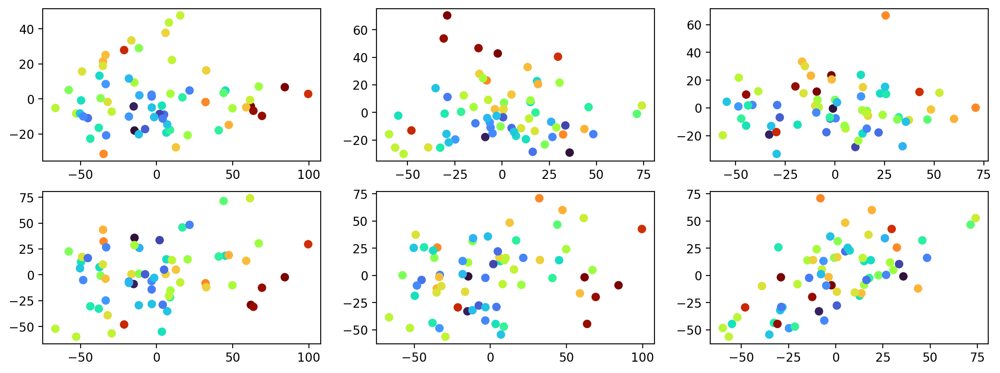

In [218]:
x_pca = PCA(n_components=6).fit_transform(train_curves[:,:,0])
y_pca = PCA(n_components=6).fit_transform(train_curves[:,:,1])
z_pca = PCA(n_components=6).fit_transform(train_curves[:,:,2])

fig = plt.figure(figsize=(14, 5), dpi=200)
ax1 = plt.subplot(231)
ax2 = plt.subplot(232)
ax3 = plt.subplot(233)
ax4 = plt.subplot(234)
ax5 = plt.subplot(235)
ax6 = plt.subplot(236)

ax1.scatter(x_pca[:,0],x_pca[:,1],c=train_geodesic_d,cmap=cmap)
ax2.scatter(y_pca[:,0],y_pca[:,1],c=train_geodesic_d,cmap=cmap)
ax3.scatter(z_pca[:,0],z_pca[:,1],c=train_geodesic_d,cmap=cmap)
ax4.scatter(x_pca[:,0],y_pca[:,0],c=train_geodesic_d,cmap=cmap)
ax5.scatter(x_pca[:,0],z_pca[:,0],c=train_geodesic_d,cmap=cmap)
ax6.scatter(y_pca[:,0],z_pca[:,0],c=train_geodesic_d,cmap=cmap)

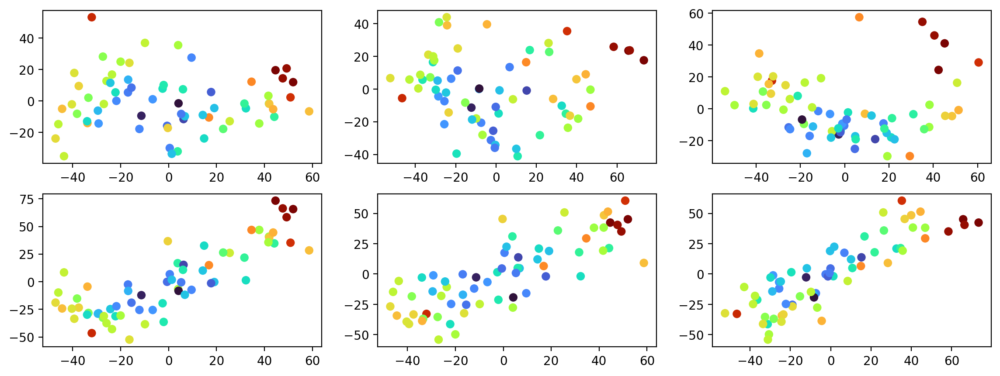

In [230]:
x_pca = PCA(n_components=6).fit_transform(train_srvf_curves[:,:,0])
y_pca = PCA(n_components=6).fit_transform(train_srvf_curves[:,:,1])
z_pca = PCA(n_components=6).fit_transform(train_srvf_curves[:,:,2])

fig = plt.figure(figsize=(14, 5), dpi=200)
ax1 = plt.subplot(231)
ax2 = plt.subplot(232)
ax3 = plt.subplot(233)
ax4 = plt.subplot(234)
ax5 = plt.subplot(235)
ax6 = plt.subplot(236)

ax1.scatter(x_pca[:,0],x_pca[:,1],c=train_geodesic_d,cmap=cmap)
ax2.scatter(y_pca[:,0],y_pca[:,1],c=train_geodesic_d,cmap=cmap)
ax3.scatter(z_pca[:,0],z_pca[:,1],c=train_geodesic_d,cmap=cmap)
ax4.scatter(x_pca[:,0],y_pca[:,0],c=train_geodesic_d,cmap=cmap)
ax5.scatter(x_pca[:,0],z_pca[:,0],c=train_geodesic_d,cmap=cmap)
ax6.scatter(y_pca[:,0],z_pca[:,0],c=train_geodesic_d,cmap=cmap)

uni PCA在train集上的相关系数： 0.6616458806221318


Text(0.18, 0.95, 'correlation: 0.662')

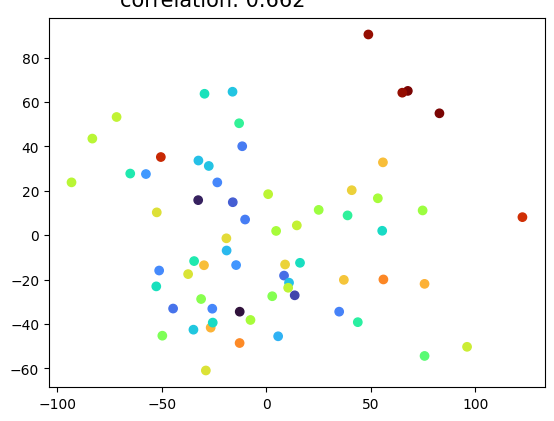

In [228]:
xyz_res = np.concatenate([x_pca,y_pca,z_pca],axis=1)
pca = PCA(n_components=6)
xyz_res_pca = pca.fit_transform(xyz_res)

plt.scatter(xyz_res_pca[:,0],xyz_res_pca[:,1],c=train_geodesic_d,cmap=cmap)

pca_uni_dist = []
for i in range(train_coord_result.shape[0]):
    # pca_coord_dist.append(np.linalg.norm([train_coord_result[i, 0], train_coord_result[i, 1]]))
    pca_uni_dist.append(np.linalg.norm(xyz_res_pca[i]))

correlation_matrix = np.corrcoef(pca_uni_dist, train_geodesic_d)
print ("uni PCA在train集上的相关系数：", correlation_matrix[0,1])
plt.text(.18,0.95,"correlation: "+str(round(correlation_matrix[0,1],3)),fontsize=15,ha="center",va="center",transform=ax.transAxes)

721.3176066727799
64.01263973049377
64.01263973049383


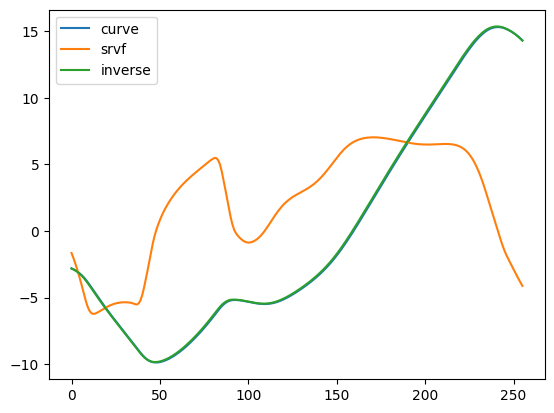

In [250]:
plt.plot(interpolated_curves[13][:,0],label="curve")
plt.plot(srvf_curves[13][:,0],label="srvf")
inverse_curve = inverse_srvf(srvf_curves[13], [0,0,0])
print (measure_length(inverse_curve))
print (measure_length(interpolated_curves[13]))
inverse_curve = inverse_curve/measure_length(inverse_curve)*measure_length(interpolated_curves[13])
print (measure_length(inverse_curve))
plt.plot(inverse_curve[:,0]+interpolated_curves[13][0,0],label="inverse")
plt.legend()